# TED 2D CAMUS - Temporal consistency

In [1]:
# Imports
from skimage import io
import os
import matplotlib.pyplot as plt
import numpy as np
import json
import cv2
import re
from matplotlib.lines import Line2D

# Full cardiac cycle A4C - Visualization

In [76]:
# Base directory
os.chdir('D:/TFG/TED/database')

In [77]:
def visualization(patient, frame, seq_path, seq_gt_path, seq_pred_path):
    # Read files
    seq = io.imread(seq_path, plugin='simpleitk')
    seq_gt = io.imread(seq_gt_path, plugin='simpleitk')
    seq_pred = io.imread(seq_pred_path, plugin='simpleitk')

    # Plot images
    fig = plt.figure(figsize=(15, 5))
    gs = fig.add_gridspec(1, 3, hspace=0.1, wspace=0.1)
    (ax1, ax2, ax3) = gs.subplots(sharex='col', sharey='row')

    # Frame
    ax1.imshow(seq[frame], cmap='gray')
    ax1.set_title('Patient {} frame {}'.format(patient, frame))
    ax1.axis('auto')

    # Frame ground truth
    ax2.imshow(seq_gt[frame], cmap='gray')
    ax2.set_title('Ground truth')
    ax2.axis('auto')
    
    # Frame predicted
    ax3.imshow(seq_pred[frame], cmap='gray')
    ax3.set_title('Predicted')
    ax3.axis('auto')

# 1. Individual frames prediction - Results

In [78]:
# Base directory
os.chdir('D:/TFG/TED/individual_pred')

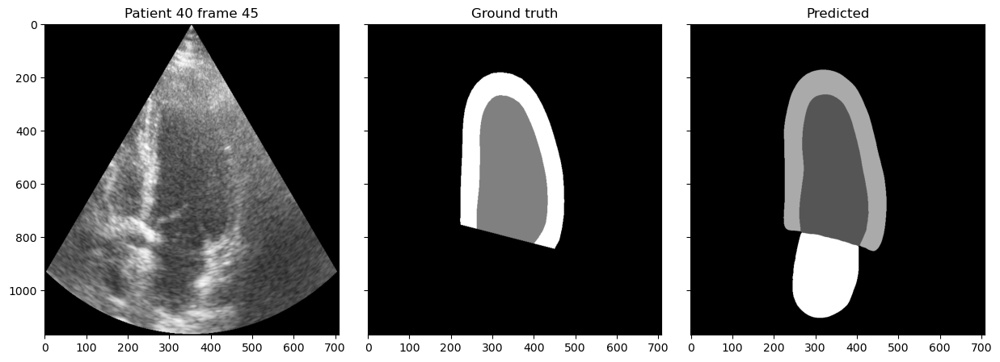

In [79]:
patient = '40' # From 01 to 98
frame = 45
seq_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence.mhd'.format(patient, patient)
seq_gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
seq_pred_path = 'D:/TFG/TED/individual_pred/patient0{}_4CH.nii'.format(patient)
    
visualization(patient, frame, seq_path, seq_gt_path, seq_pred_path)

50
(1167, 708)


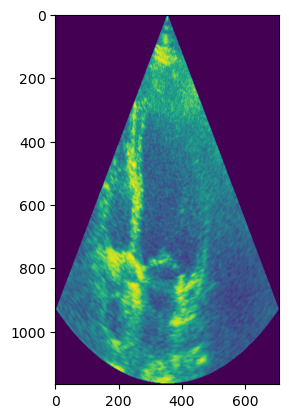

In [80]:
seq = io.imread(seq_path, plugin='simpleitk')
print(seq.shape[0])
print(seq[2].shape)
io.imsave('D:/TFG/TED/nifti_database/prueba.nii', seq[2])
img = io.imread('D:/TFG/TED/nifti_database/prueba.nii', plugin='simpleitk')
plt.imshow(img)
# frame_T = 0000
# frame t+4 = 0000

## 1.1 Evaluation

## 1.2 Number of pixels

In [81]:
patient = '80'

# GROUND TRUTH
gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
seq_gt = io.imread(gt_path, plugin='simpleitk')

pixels_4CH_Endo_gt = []
pixels_4CH_Epi_gt = []

for i in range(0, seq_gt.shape[0]):
    pixels_4CH_Endo_gt.append(np.sum(seq_gt[i] == 1)) # 1 correspond to the LV Endo
    pixels_4CH_Epi_gt.append(np.sum(seq_gt[i] == 2)) # 2 correspond to the LV Epi

# PREDICTION
pred_path = 'D:/TFG/TED/individual_pred/patient0{}_4CH.nii'.format(patient)
seq_pred = io.imread(pred_path, plugin='simpleitk')

pixels_4CH_Endo = []
pixels_4CH_Epi = []

for i in range(0, seq_pred.shape[0]):
    pixels_4CH_Endo.append(np.sum(seq_pred[i] == 1)) # 1 correspond to the LV Endo
    pixels_4CH_Epi.append(np.sum(seq_pred[i] == 2)) # 2 correspond to the LV Epi

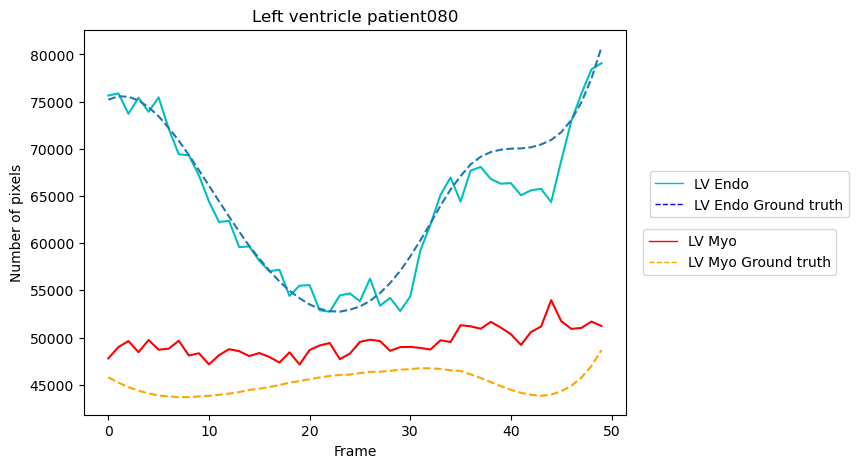

In [82]:
# Create figure
fig = plt.figure(figsize=(7, 5))
gs = fig.add_gridspec(1, 1, hspace=0.1, wspace=0.1)
ax1 = gs.subplots(sharex='col', sharey='row')
    
# LV Endocardium
ax1.plot(pixels_4CH_Endo, 'c',label = 'LV Endo')
ax1.plot(pixels_4CH_Endo_gt, linestyle='dashed', label = 'LV Endo gt')

LV_Endo = [Line2D([0], [0], color='c', lw=1, label='LV Endo'),
           Line2D([0], [0], color='blue', lw=1, label='LV Endo Ground truth', linestyle='dashed')]

# LV Epicardium
ax1.plot(pixels_4CH_Epi, 'r',label = 'LV Myo')
ax1.plot(pixels_4CH_Epi_gt, 'orange', linestyle='dashed', label = 'LV Epi gt')

LV_Epi = [Line2D([0], [0], color='r', lw=1, label='LV Myo'),
          Line2D([0], [0], color='orange', lw=1, label='LV Myo Ground truth', linestyle='dashed')]

# Legend
legend = ax1.legend(handles=LV_Endo, loc='upper right', bbox_to_anchor=(1.423, 0.65))
ax1.add_artist(legend)
ax1.legend(handles=LV_Epi, loc='upper right', bbox_to_anchor=(1.4, 0.5))

ax1.set_xlabel("Frame")
ax1.set_ylabel("Number of pixels")
ax1.set_title("Left ventricle patient0{}".format(patient))
plt.show()

## 1.3 Animation

### 1.3.1 Save frames

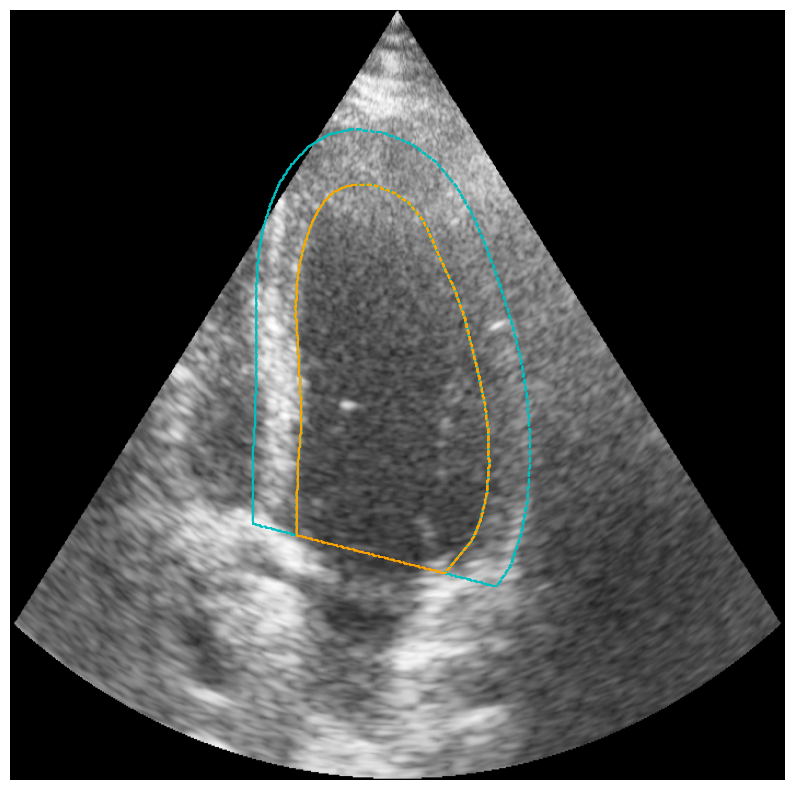

In [51]:
seq_pred_path = 'patient0{}_4CH.nii'.format(patient, patient)
seq_gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
seq_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence.mhd'.format(patient, patient)

seq_pred = io.imread(seq_pred_path, plugin='simpleitk')
seq_gt = io.imread(seq_gt_path, plugin='simpleitk')
seq = io.imread(seq_path, plugin='simpleitk')

fig = plt.figure(figsize=(10, 10))
gs = fig.add_gridspec(1, 1, hspace=0.1, wspace=0.1)
(ax1) = gs.subplots(sharex='col', sharey='row')
ax1.axis('off')

ax1.imshow(seq[i], cmap='gray')
# ax1.contour(seq_pred[i]==2, colors='g', linewidths = 0.5)
# ax1.contour(seq_pred[i]==1, colors='r', linewidths = 0.5)
ax1.contour(seq_gt[i]==2, colors='c', linewidths = 1, linestyles='dashed')
ax1.contour(seq_gt[i]==1, colors='orange', linewidths = 1, linestyles='dashed')
ax1.axis('auto')

for ax in fig.get_axes():
    ax.label_outer()

In [46]:
os.chdir('D:/TFG/TED/individual_pred')
patient = '30' # patient

if (os.path.exists('animation/patient0{}'.format(patient)) == False):
    os.mkdir('animation/patient0{}.'.format(patient))

seq_pred_path = 'patient0{}_4CH.nii'.format(patient, patient)
seq_gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
seq_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence.mhd'.format(patient, patient)

seq_pred = io.imread(seq_pred_path, plugin='simpleitk')
seq = io.imread(seq_path, plugin='simpleitk')

for i in range(0, seq.shape[0]):

    fig = plt.figure(figsize=(10, 10))
    gs = fig.add_gridspec(1, 1, hspace=0.1, wspace=0.1)
    (ax1) = gs.subplots(sharex='col', sharey='row')
    ax1.axis('off')

    ax1.imshow(seq[i], cmap='gray')
    ax1.contour(seq_pred[i]==2, colors='g', linewidths = 1)
    ax1.contour(seq_pred[i]==1, colors='r', linewidths = 1)
    ax1.axis('auto')

    for ax in fig.get_axes():
        ax.label_outer()

    fig.savefig('animation/patient0{}/frame_{}.png'.format(patient, i), bbox_inches='tight', transparent=True, pad_inches=0)
    
    plt.close(i)
    
plt.close(seq.shape[0])

### 1.3.2 Save gif

In [10]:
import imageio.v2 as imageio
import os 

# Save GIF
os.chdir('D:/TFG/TED/individual_pred/animation/patient0{}'.format(patient))
filenames = os.listdir('D:/TFG/TED/individual_pred/animation/patient0{}'.format(patient))
sorted_filenames = sorted(filenames, key=lambda x: int(re.search(r'\d+', x).group()))

with imageio.get_writer('Patient0{}.gif'.format(patient), mode='I') as writer:
    for filename in sorted_filenames:
        image = imageio.imread(filename)
        writer.append_data(image)

### 1.3.3 Display gif

<h1>Full cardiac cycle A4C from Patient030<h1>

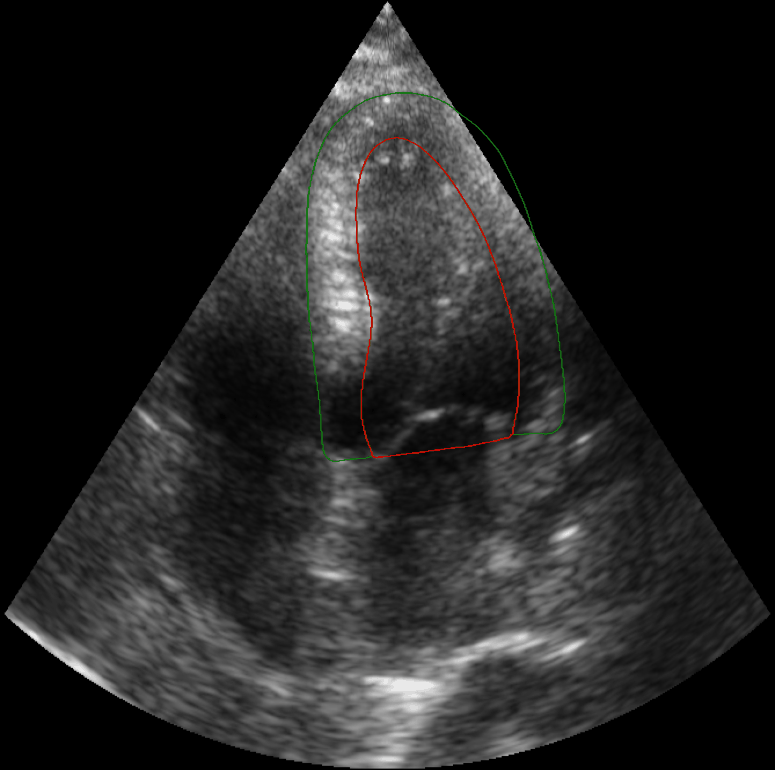

In [25]:
from IPython.display import Image, display, Markdown

patient = '30' # patient
path = 'D:/TFG/TED/individual_pred/animation/patient0{}/Patient0{}.gif'.format(patient, patient)

with open(path,"rb") as f:
    display(Markdown("<h1>Full cardiac cycle A4C from Patient0{}<h1>".format(patient)))
    display(Image(data=f.read(), format='png', width=450, height=450))

# 2. Adjacent frames prediction - Results

Training: _0001 (t-1), _0000 (t) with label, _00002 (t+1)

In [2]:
# Base directory
os.chdir('D:/TFG/TED/adjacent_pred')

(-0.5, 550.5, 907.5, -0.5)

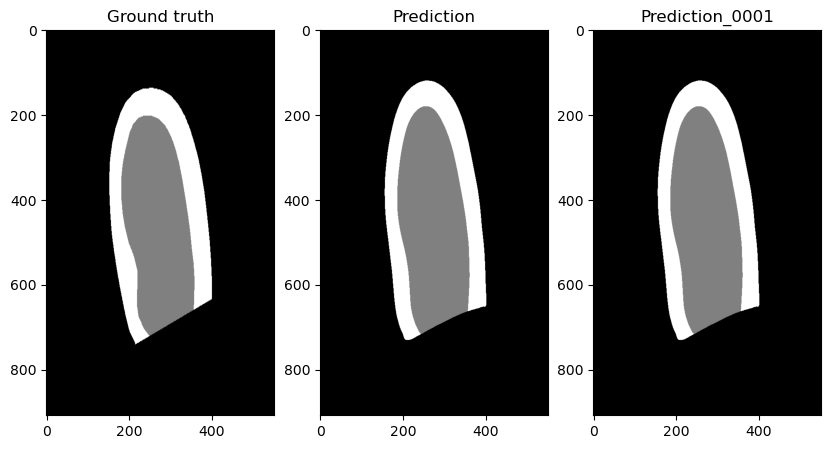

In [3]:
frame = 20
patient = '085'

fig = plt.figure(figsize=(10, 5))

gt = io.imread('D:/TFG/TED/database/patient{}/patient{}_4CH_sequence_gt.mhd'.format(patient, patient), plugin='simpleitk')
result = io.imread('D:/TFG/TED/Results/patient{}_{}.nii.gz'.format(patient, frame), plugin='simpleitk')
result_0001 = io.imread('D:/TFG/TED/Results_0001/patient{}_{}.nii.gz'.format(patient, frame), plugin='simpleitk')

plt.subplot(1, 3, 1)
plt.title('Ground truth')
plt.imshow(gt[frame], cmap='gray')
plt.axis('auto')

plt.subplot(1, 3, 2)
plt.title('Prediction')
plt.imshow(result[0], cmap='gray')
plt.axis('auto')

plt.subplot(1, 3, 3)
plt.title('Prediction_0001')
plt.imshow(result_0001[0], cmap='gray')
plt.axis('auto')

## 2.1 Evaluation

## 2.2. Number of pixels

### Save number pixels

In [78]:
# From 80 to 98
patient = '84'

### GROUND TRUTH ###
gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
seq_gt = io.imread(gt_path, plugin='simpleitk')

pixels_4CH_Endo_gt = []
pixels_4CH_Myo_gt = []

for i in range(0, seq_gt.shape[0]):
    pixels_4CH_Endo_gt.append(np.sum(seq_gt[i] == 1)) # 1 correspond to the LV Endo
    pixels_4CH_Myo_gt.append(np.sum(seq_gt[i] == 2)) # 2 correspond to the LV Epi
    
### PREDICTION ###
pred_path = 'D:/TFG/TED/individual_pred/patient0{}_4CH.nii'.format(patient)
seq_pred = io.imread(pred_path, plugin='simpleitk')

pixels_4CH_Endo = []
pixels_4CH_Myo = []

for i in range(0, seq_pred.shape[0]):
    pixels_4CH_Endo.append(np.sum(seq_pred[i] == 1)) # 1 correspond to the LV Endo
    pixels_4CH_Myo.append(np.sum(seq_pred[i] == 2)) # 2 correspond to the LV Epi
    
### TEMPORAL PREDICTION ###
pixels_temporal_Endo = []
pixels_temporal_Myo = []

for i in range(1, seq_gt.shape[0]-1):
    if i > 9:
        pred_path = 'D:/TFG/TED/Results/patient0{}_{}.nii'.format(patient, i)
        seq_pred = io.imread(pred_path, plugin='simpleitk')
    else:
        pred_path = 'D:/TFG/TED/Results/patient0{}_0{}.nii'.format(patient, i)
        seq_pred = io.imread(pred_path, plugin='simpleitk')
        
    pixels_temporal_Endo.append(np.sum(seq_pred[0] == 1))
    pixels_temporal_Myo.append(np.sum(seq_pred[0] == 2))

### Plot

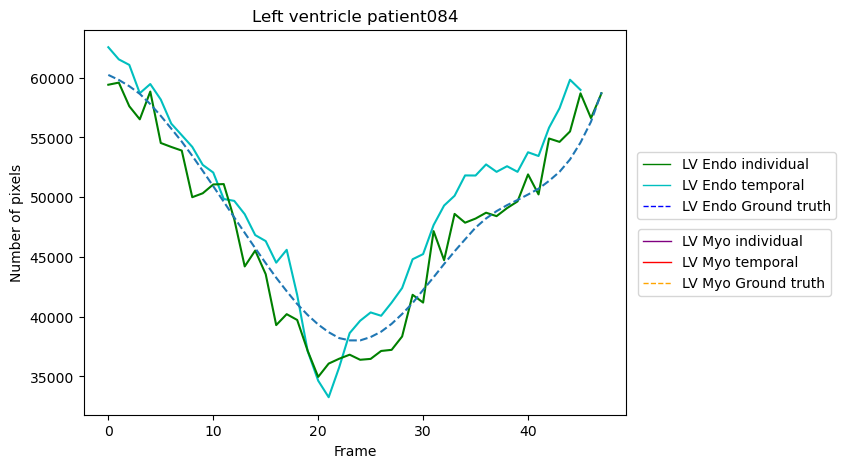

In [79]:
# Create figure
fig = plt.figure(figsize=(7, 5))
gs = fig.add_gridspec(1, 1, hspace=0.1, wspace=0.1)
ax1 = gs.subplots(sharex='col', sharey='row')
    
# LV Endocardium
ax1.plot(pixels_temporal_Endo, 'c',label = 'LV Endo') # Temporal prediction
ax1.plot(pixels_4CH_Endo, 'green',label = 'LV Endo') # Individual prediction
ax1.plot(pixels_4CH_Endo_gt, linestyle='dashed', label = 'LV Endo gt') # Ground truth

LV_Endo = [Line2D([0], [0], color='green', lw=1, label='LV Endo individual'),
           Line2D([0], [0], color='c', lw=1, label='LV Endo temporal'),
           Line2D([0], [0], color='blue', lw=1, label='LV Endo Ground truth', linestyle='dashed')]

# # LV Myocardium
# ax1.plot(pixels_temporal_Myo, 'r',label = 'LV Myo')
# ax1.plot(pixels_4CH_Myo, 'purple',label = 'LV Myo')
# ax1.plot(pixels_4CH_Myo_gt, 'orange', linestyle='dashed', label = 'LV Myo gt')

# LV_Epi = [Line2D([0], [0], color='purple', lw=1, label='LV Myo individual'),
#           Line2D([0], [0], color='r', lw=1, label='LV Myo temporal'),
#           Line2D([0], [0], color='orange', lw=1, label='LV Myo Ground truth', linestyle='dashed')]

# Legend
legend = ax1.legend(handles=LV_Endo, loc='upper right', bbox_to_anchor=(1.4, 0.7))
ax1.add_artist(legend)
ax1.legend(handles=LV_Epi, loc='upper right', bbox_to_anchor=(1.39, 0.5))

ax1.set_xlabel("Frame")
ax1.set_ylabel("Number of pixels")
ax1.set_title("Left ventricle patient0{}".format(patient))
plt.show()

## 2.3 Animation

In [145]:
def count_pixels(patient, path):
    
    sequence = io.imread(path, plugin='simpleitk')

    pixels_4CH_Endo = []
    pixels_4CH_Myo = []

    for i in range(0, sequence.shape[0]):
        pixels_4CH_Endo.append(np.sum(sequence[i] == 1)) # 1 correspond to the LV Endo
        pixels_4CH_Myo.append(np.sum(sequence[i] == 2)) # 2 correspond to the LV Epi
        
    return pixels_4CH_Endo, pixels_4CH_Myo

In [236]:
# Patient from 80 to 98
patient = input('Enter patient (80-98): ')

# Paths
gt_path = 'D:/TFG/TED/database/patient0{}/patient0{}_4CH_sequence_gt.mhd'.format(patient, patient)
seq_gt = io.imread(gt_path, plugin='simpleitk')

ind_path = 'D:/TFG/TED/individual_pred/patient0{}_4CH.nii'.format(patient)

# Count pixels
pixels_4CH_Endo_gt, pixels_4CH_Myo_gt = count_pixels(patient, gt_path)
pixels_4CH_Endo, pixels_4CH_Myo = count_pixels(patient, ind_path)

### FIRST TEMPORAL PREDICTION ###
pixels_first_temporal_Endo = []
pixels_first_temporal_Myo = []

for i in range(1, seq_gt.shape[0]-1):
    if i > 9:
        pred_path = 'D:/TFG/TED/Results/patient0{}_{}.nii'.format(patient, i)
        seq_pred = io.imread(pred_path, plugin='simpleitk')
    else:
        pred_path = 'D:/TFG/TED/Results/patient0{}_0{}.nii'.format(patient, i)
        seq_pred = io.imread(pred_path, plugin='simpleitk')
        
    pixels_first_temporal_Endo.append(np.sum(seq_pred[0] == 1))
    pixels_first_temporal_Myo.append(np.sum(seq_pred[0] == 2))
    
### SECOND TEMPORAL PREDICTION ###
pixels_temporal_Endo = []
pixels_temporal_Myo = []

for i in range(2, seq_gt.shape[0]-1):
    if i > 9:
        pred_path = 'D:/TFG/TED/Results_680/patient0{}_4CH_{}.nii'.format(patient, i)
        seq_pred = io.imread(pred_path, plugin='simpleitk')
    else:
        pred_path = 'D:/TFG/TED/Results_680/patient0{}_4CH_0{}.nii'.format(patient, i)
        seq_pred = io.imread(pred_path, plugin='simpleitk')
        
    pixels_temporal_Endo.append(np.sum(seq_pred[0] == 1))
    pixels_temporal_Myo.append(np.sum(seq_pred[0] == 2))

pixels_temporal_Endo.insert(0, pixels_temporal_Endo[0])

Enter patient (80-98): 95


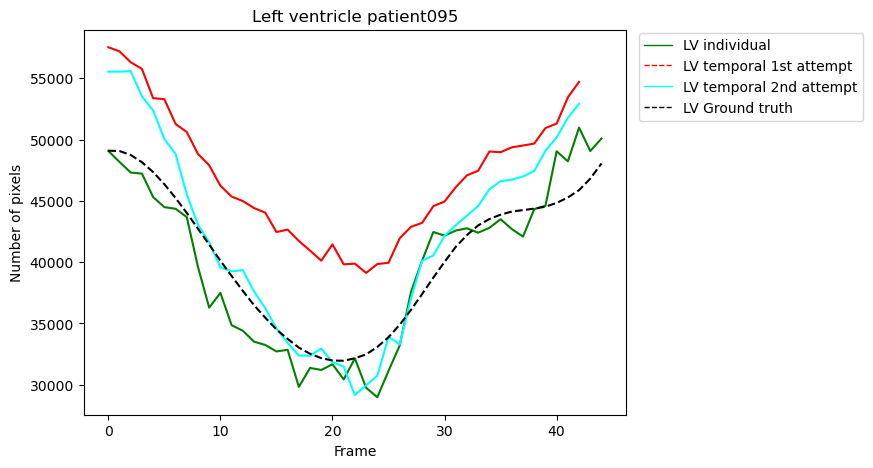

In [237]:
# Create figure
fig = plt.figure(figsize=(7, 5))
gs = fig.add_gridspec(1, 1, hspace=0.1, wspace=0.1)
ax1 = gs.subplots(sharex='col', sharey='row')
    
# LV Endocardium
ax1.plot(pixels_4CH_Endo, 'green',label = 'LV Endo') # Individual prediction
ax1.plot(pixels_first_temporal_Endo, 'red',label = 'LV Endo') # First temporal prediction
ax1.plot(pixels_temporal_Endo, 'cyan',label = 'LV Endo') # Second temporal prediction
ax1.plot(pixels_4CH_Endo_gt, 'black', linestyle='dashed', label = 'LV Endo gt') # Ground truth

LV_Endo = [Line2D([0], [0], color='green', lw=1, label='LV individual'),
           Line2D([0], [0], color='red', lw=1, label='LV temporal 1st attempt', linestyle='dashed'),
           Line2D([0], [0], color='cyan', lw=1, label='LV temporal 2nd attempt'),
           Line2D([0], [0], color='black', lw=1, label='LV Ground truth', linestyle='dashed')]


# Legend
legend = ax1.legend(handles=LV_Endo, loc='upper right', bbox_to_anchor=(1.45, 1.01))

ax1.set_xlabel("Frame")
ax1.set_ylabel("Number of pixels")
ax1.set_title("Left ventricle patient0{}".format(patient))
plt.show()